In [1]:
import os
os.chdir('/home/sebastiaan/PhD/Repositories/immune_response_detection/')

# **Yellow Fever virus dataset**

In [2]:
import pandas as pd
import numpy as np
import time

from raptcr.constants.datasets import sample_tcrs
from raptcr.constants.sampling import match_vj_distribution
from raptcr.constants.preprocessing import IMGT
from raptcr.constants.parsing import parse_yfv_repertoires
from raptcr.hashing import TCRDistEncoder
from raptcr.neighbors import NeighborEnrichment

In [3]:
df = parse_yfv_repertoires('./data/yfv/P2_0_F1_.txt.gz')
df.head()

/home/sebastiaan/PhD/Repositories/immune_response_detection/raptcr/constants/parsing.py:18: DtypeWarning: Columns (8,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file, compression='gzip', sep='\t')


,junction_aa,v_call,j_call,duplicate_count,convergence
0,CAAADLPTYNEQFF,TRBV24-1*01,TRBJ2-1*01,2,1
1,CAAAGGGTGELFF,TRBV24-1*01,TRBJ2-2*01,2,1
2,CAAAGGSQPQHF,TRBV19*01,TRBJ1-5*01,2,1
3,CAAAGKRTDTQYF,TRBV10-3*01,TRBJ2-3*01,4,1
4,CAAAQQGRADTQYF,TRBV6-1*01,TRBJ2-3*01,2,1


In [4]:
folder = './data/yfv/'
repertoires = os.listdir(folder)
filenames = [os.path.join(folder,f) for f in repertoires]

repsizes = [parse_yfv_repertoires(file).shape[0] for file in filenames]

In [128]:
def parse_vdjdb(pathogen='YFV', gene='TRB', organism='HomoSapiens'):
    
    vdjdb = pd.read_csv('./data/vdjdb/vdjdb.txt', sep='\t')

    if gene == 'paired':
        vdjdb = vdjdb[(vdjdb.species==organism) & (vdjdb.gene.isin(['TRA','TRB'])) & (vdjdb['antigen.species']==pathogen)]
    else:
        vdjdb = vdjdb[(vdjdb.species==organism) & (vdjdb.gene==gene) & (vdjdb['antigen.species']==pathogen)]

    remap = {
        'gene':'chain',
        'cdr3':'junction_aa',
        'v.segm':'v_call',
        'j.segm':'j_call',
        'antigen.epitope':'epitope'
        }

    vdjdb = vdjdb.rename(columns=remap)
    vdjdb = vdjdb[list(remap.values())]

    vdjdb['tcr'] = vdjdb.v_call + '_' + vdjdb.junction_aa
    
    return vdjdb

In [209]:
import networkx as nx
import matplotlib.pyplot as plt

from raptcr.indexing import FlatIndex

resdir = '/home/sebastiaan/PhD/Repositories/immune_response_detection/data/yfv_res/test/'
datadir = '/home/sebastiaan/PhD/Repositories/immune_response_detection/data/yfv/'

def get_sign_network(repertoire_file='Q1_pre0_F1_.txt.gz', results_file='Q1_pre0_F1_.tsv', fdr=1e-6, n=64494):

    df = parse_yfv_repertoires(os.path.join(datadir,repertoire_file))
    df = df.sort_values(by='duplicate_count', ascending=False).reset_index(drop=True)
    df = df[:n-1]

    res = pd.read_csv(os.path.join(resdir,results_file), sep='\t')
    sign = res[res.pval<fdr]

    sign['tcr'] = sign.v_call + '_' + sign.junction_aa
    sign['logpval'] = -np.log10(sign.pval)

    h = TCRDistEncoder(aa_dim=8, full_tcr=True).fit()
    index = FlatIndex(hasher=h)
    index.add(df)

    total = []
    for i in range(len(sign)):
        source = sign.loc[i:i]
        nbrs = index.radius_search(source, r=12.5)
        nbrs = pd.DataFrame(nbrs, columns=['target','weight'])
        nbrs[['target_v_call', 'target_junction_aa']] = nbrs.target.str.split('_', expand=True)
        nbrs['source_v_call'] = source.v_call[i]
        nbrs['source_junction_aa'] = source.junction_aa[i]
        total.append(nbrs)
    total = pd.concat(total)
    total['source'] = total.source_v_call + '_' + total.source_junction_aa

    return df, sign, total

def plot_network(df, sign, highlight_clones, title='', ax=None):

    if ax is None:
        fig, ax = plt.subplots(dpi=150)

    edges = df[['source','target','weight']]
    G = nx.from_pandas_edgelist(edges)

    nx.set_node_attributes(G, dict(zip(sign.tcr, sign.logpval)), name='size')

    for i in G.nodes():
        try:
            nx.get_node_attributes(G,'size')[i]
        except KeyError:
            nx.set_node_attributes(G,{i:3},name='size')

    size = list(nx.get_node_attributes(G,'size').values())
    color = ['red' if node in yfv_clones else 'lightgray' for node in G.nodes()]
    pos = nx.spring_layout(G, k=.05, iterations=50)

    nx.draw(
        G, 
        with_labels=False, 
        node_size=size, 
        node_color=color, 
        alpha=.75, 
        linewidths=.5, 
        width=.1,
        pos=pos,
        ax=ax
        )

    ax.collections[0].set_edgecolor("black")
    limits=plt.axis('on') # turns on axis
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax.set_title(title)

def get_ld1_clones(total, vdjdb):

    alltcr = list(set(total.source.to_list() + total.target.to_list()))
    combs = list(itertools.product(vdjdb.tcr, alltcr))
    ld = [lev.distance(i[0],i[1]) for i in combs]

    result = pd.DataFrame(
        {'a':[i[0] for i in combs],
        'b':[i[1] for i in combs],
        'distance':ld}
        )

    return result[result.distance<=1].b.to_list()

# sign, total = get_sign_network()

/tmp/ipykernel_526412/853409533.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sign['tcr'] = sign.v_call + '_' + sign.junction_aa
/tmp/ipykernel_526412/853409533.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sign['logpval'] = -np.log10(sign.pval)


['TRBV28*01_CASSLSYEQYF', 'TRBV28*01_CASSLFYEQYF', 'TRBV29-1*01_CSVEGGTDTQYF']


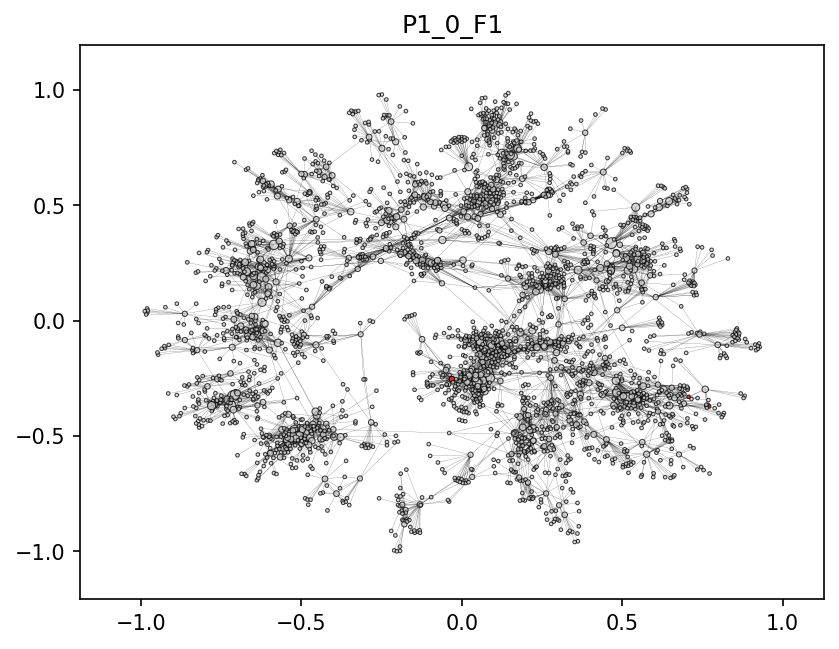

In [178]:
fig, ax = plt.subplots()

df, sign, total = get_sign_network(repertoire_file='P1_0_F1_.txt.gz', results_file='P1_0_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
print(yfv_clones)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P1_0_F1')

/tmp/ipykernel_526412/853409533.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sign['tcr'] = sign.v_call + '_' + sign.junction_aa
/tmp/ipykernel_526412/853409533.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sign['logpval'] = -np.log10(sign.pval)


TRBV6-4*01_CASSDSTTDTQYF
TRBV6-4*01_CASSDSGEDTQYF
TRBV6-4*01_CASSDSSTDTQYF
TRBV6-4*01_CASSDSATDTQYF
TRBV5-1*01_CASSLGQGGNEQFF
TRBV6-4*01_CASSDSTTDTQYF
TRBV6-4*01_CASSDSGEDTQYF
TRBV6-4*01_CASSDSSTDTQYF
TRBV6-4*01_CASSDSATDTQYF
TRBV7-9*01_CASSLRGETQYF
TRBV20-1*01_CSAPTSGGPNEQFF
TRBV20-1*01_CSAPTSGGYNEQFF
TRBV20-1*01_CSAPTSGGDNEQFF
TRBV20-1*01_CSAPTSGGHNEQFF
TRBV20-1*01_CSAPTSGGGNEQFF
TRBV20-1*01_CSAPTSGGSNEQFF
TRBV20-1*01_CSAPTSGGANEQFF
TRBV29-1*01_CSVEGTGTDTQYF
TRBV29-1*01_CSVEGRGTDTQYF
TRBV29-1*01_CSVEGRYTDTQYF
TRBV20-1*01_CSAPTSGGGNEQFF
TRBV20-1*01_CSAPTSGGPNEQFF
TRBV20-1*01_CSAPTSGGYNEQFF
TRBV20-1*01_CSAPTSGGDNEQFF
TRBV20-1*01_CSAPTSGGHNEQFF
TRBV20-1*01_CSAPTSGGGNEQFF
TRBV20-1*01_CSAPTSGGSNEQFF
TRBV20-1*01_CSAPTSGGANEQFF
TRBV20-1*01_CSAPTSGGPNEQFF
TRBV20-1*01_CSAPTSGGYNEQFF
TRBV20-1*01_CSAPTSGGDNEQFF
TRBV20-1*01_CSAPTSGGHNEQFF
TRBV20-1*01_CSAPTSGGGNEQFF
TRBV20-1*01_CSAPTSGGSNEQFF
TRBV20-1*01_CSAPTSGGANEQFF
TRBV7-9*01_CASSQLGNEQFF
TRBV7-8*01_CASSLGNEQFF
TRBV5-1*01_CASSLAAYNEQFF
TRBV20

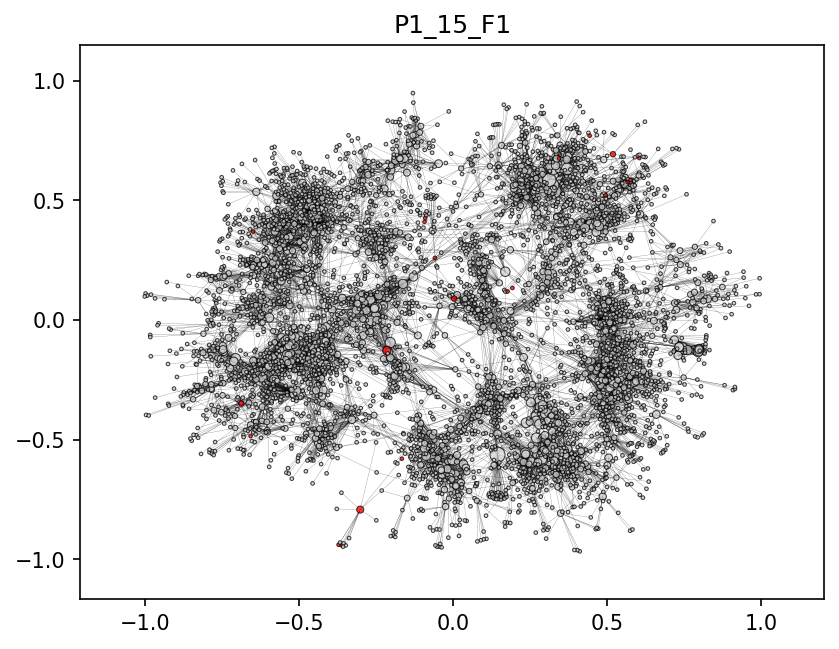

In [180]:
df, sign, total = get_sign_network(repertoire_file='P1_15_F1_.txt.gz', results_file='P1_15_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
for i in yfv_clones:
    print(i)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P1_15_F1')

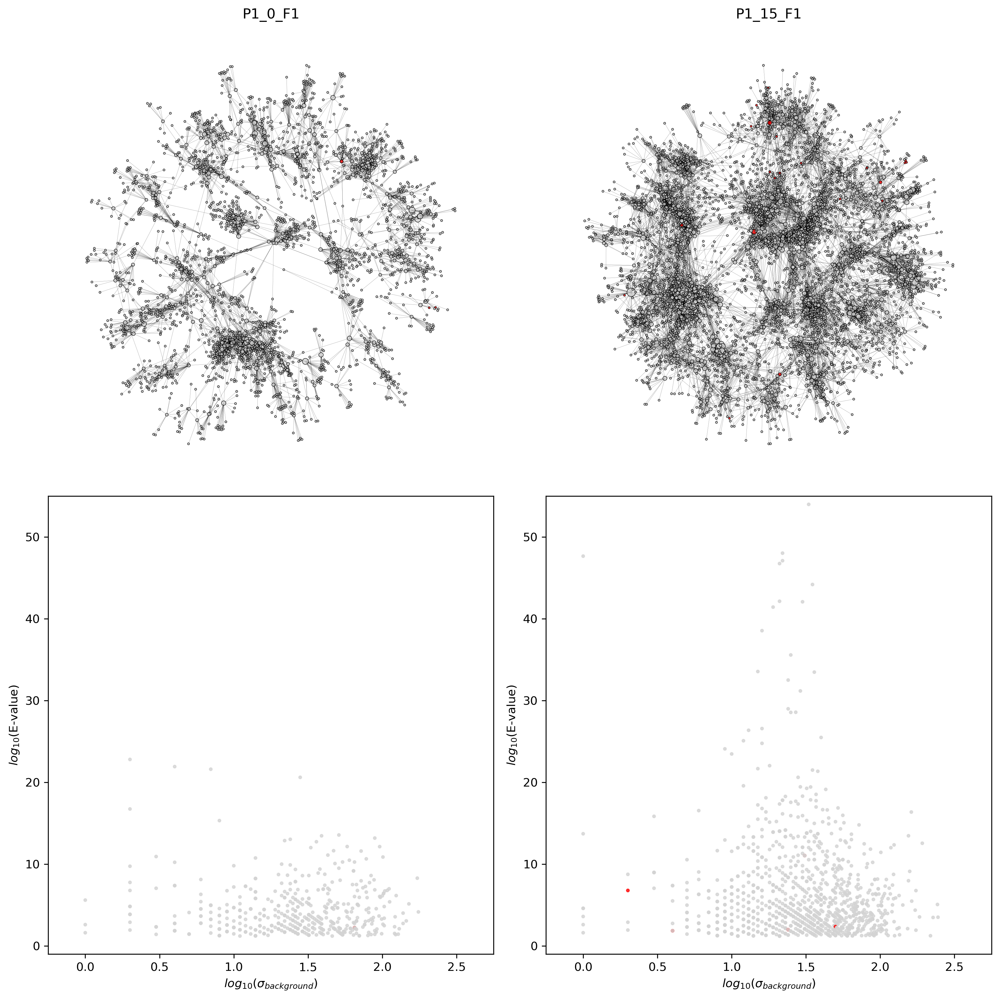

In [230]:
import warnings
warnings.filterwarnings("ignore")

fold_change = False

fig, ax = plt.subplots(nrows=2, ncols=2, dpi=300, figsize=(12,12))

df, sign, total = get_sign_network(repertoire_file='P1_0_F1_.txt.gz', results_file='P1_0_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P1_0_F1', ax=ax[0,0])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,0].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,0].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,0].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,0].set_ylabel(r'$log_{10}$(E-value)')
ax[1,0].set_xlim(-.25, 2.75)
ax[1,0].set_ylim(-1, 55)




df, sign, total = get_sign_network(repertoire_file='P1_15_F1_.txt.gz', results_file='P1_15_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P1_15_F1', ax=ax[0,1])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,1].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,1].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,1].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,1].set_ylabel(r'$log_{10}$(E-value)')
ax[1,1].set_xlim(-.25, 2.75)
ax[1,1].set_ylim(-1, 55)

fig.tight_layout()

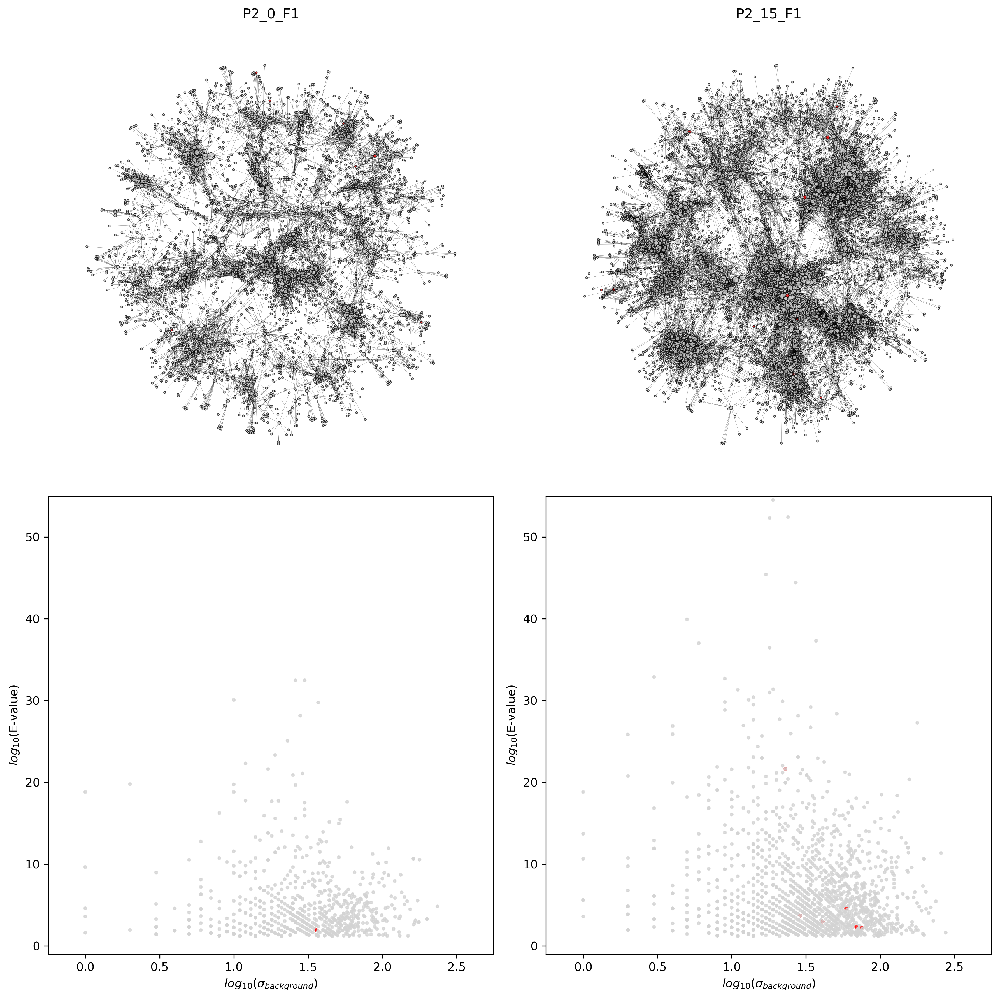

In [232]:
fold_change = False

fig, ax = plt.subplots(nrows=2, ncols=2, dpi=300, figsize=(12,12))

df, sign, total = get_sign_network(repertoire_file='P2_0_F1_.txt.gz', results_file='P2_0_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P2_0_F1', ax=ax[0,0])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,0].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,0].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,0].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,0].set_ylabel(r'$log_{10}$(E-value)')
ax[1,0].set_xlim(-.25, 2.75)
ax[1,0].set_ylim(-1, 55)

df, sign, total = get_sign_network(repertoire_file='P2_15_F1_.txt.gz', results_file='P2_15_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='P2_15_F1', ax=ax[0,1])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,1].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,1].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,1].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,1].set_ylabel(r'$log_{10}$(E-value)')
ax[1,1].set_xlim(-.25, 2.75)
ax[1,1].set_ylim(-1, 55)

fig.tight_layout()

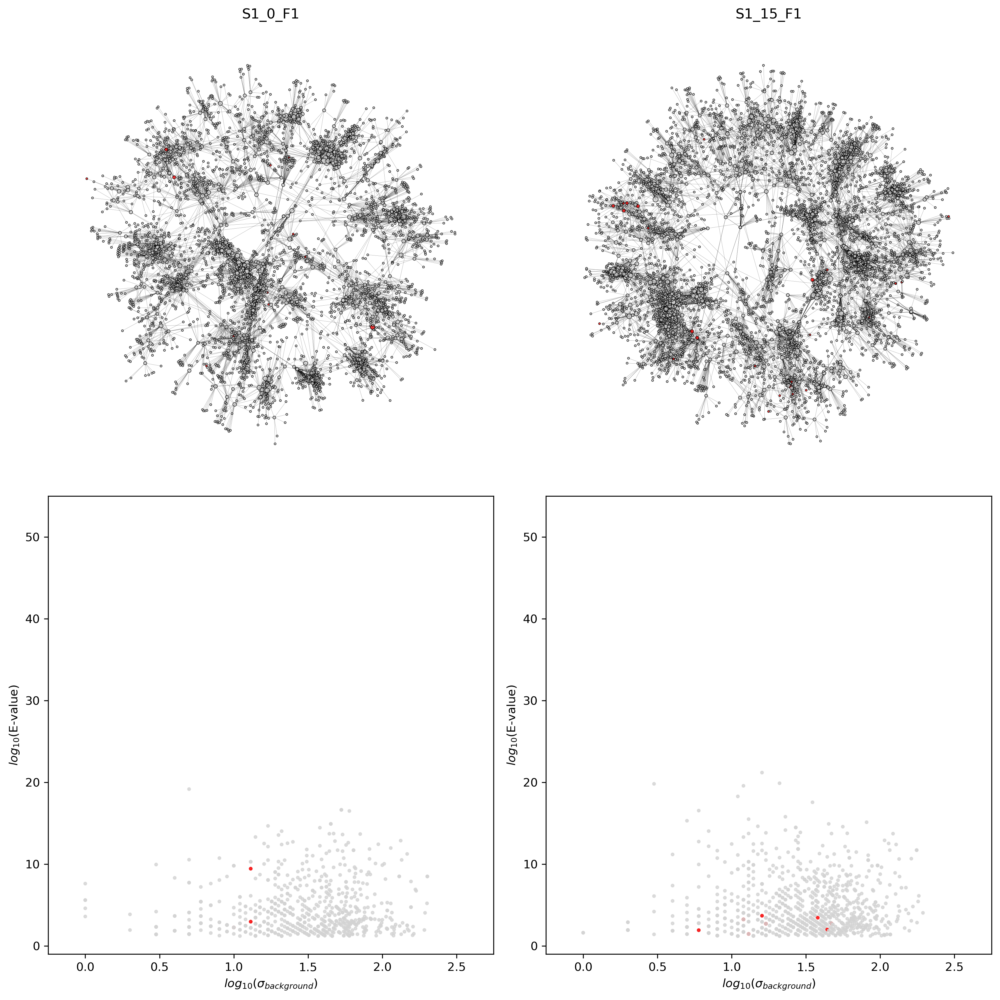

In [233]:
fold_change = False

fig, ax = plt.subplots(nrows=2, ncols=2, dpi=300, figsize=(12,12))

df, sign, total = get_sign_network(repertoire_file='S1_0_F1_.txt.gz', results_file='S1_0_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='S1_0_F1', ax=ax[0,0])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,0].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,0].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,0].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,0].set_ylabel(r'$log_{10}$(E-value)')
ax[1,0].set_xlim(-.25, 2.75)
ax[1,0].set_ylim(-1, 55)

df, sign, total = get_sign_network(repertoire_file='S1_15_F1_.txt.gz', results_file='S1_15_F1_.tsv')
yfv_clones = get_ld1_clones(total=total, vdjdb=vdjdb)
plot_network(df=total, sign=sign, highlight_clones=yfv_clones, title='S1_15_F1', ax=ax[0,1])

y = -np.log10(sign.pval * 64494)
x = np.log10(sign.background_neighbors)

if fold_change:
    c = np.log10(sign.foreground_neighbors / sign.background_neighbors)
    cbar = ax[1,1].scatter(x, y, c=c, cmap='viridis', s=5)
    fig.colorbar(cbar, label=r'$log_{10}$($\sigma_{foreground}$/$\sigma_{background}$)')
    cbar.set_clim(-.6,1.75)
else:
    c = ['red' if seq in yfv_clones else 'lightgray' for seq in sign.tcr.to_list()]
    ax[1,1].scatter(x, y, c=c, alpha=.75, s=5)

ax[1,1].set_xlabel(r'$log_{10}$($\sigma_{background}$)')
ax[1,1].set_ylabel(r'$log_{10}$(E-value)')
ax[1,1].set_xlim(-.25, 2.75)
ax[1,1].set_ylim(-1, 55)

fig.tight_layout()

In [231]:
fig.savefig('./fig/yfv_network_P1_annotated.png', format='png', bbox_inches='tight')

In [89]:
def parse_vdjdb(pathogen='YFV', gene='TRB', organism='HomoSapiens'):
    
    vdjdb = pd.read_csv('./data/vdjdb/vdjdb.txt', sep='\t')

    if gene == 'paired':
        vdjdb = vdjdb[(vdjdb.species==organism) & (vdjdb.gene.isin(['TRA','TRB'])) & (vdjdb['antigen.species']==pathogen)]
    else:
        vdjdb = vdjdb[(vdjdb.species==organism) & (vdjdb.gene==gene) & (vdjdb['antigen.species']==pathogen)]

    remap = {
        'gene':'chain',
        'cdr3':'junction_aa',
        'v.segm':'v_call',
        'j.segm':'j_call',
        'antigen.epitope':'epitope'
        }

    vdjdb = vdjdb.rename(columns=remap)
    vdjdb = vdjdb[list(remap.values())]

    vdjdb['tcr'] = vdjdb.v_call + '_' + vdjdb.junction_aa
    
    return vdjdb

vdjdb = parse_vdjdb()
vdjdb

,chain,junction_aa,v_call,j_call,epitope,tcr
3518,TRB,CSVVDAAPGANVLTF,TRBV29-1*01,TRBJ2-6*01,LLWNGPMAV,TRBV29-1*01_CSVVDAAPGANVLTF
3519,TRB,CAWSPGPVNEQFF,TRBV30*01,TRBJ2-1*01,LLWNGPMAV,TRBV30*01_CAWSPGPVNEQFF
3520,TRB,CSARASYEQYF,TRBV20-1*01,TRBJ2-7*01,LLWNGPMAV,TRBV20-1*01_CSARASYEQYF
3521,TRB,CASSDSGTDTQYF,TRBV6-4*01,TRBJ2-3*01,LLWNGPMAV,TRBV6-4*01_CASSDSGTDTQYF
3522,TRB,CASSFGTGRAGYTF,TRBV5-6*01,TRBJ1-2*01,LLWNGPMAV,TRBV5-6*01_CASSFGTGRAGYTF
...,...,...,...,...,...,...
83088,TRB,CASSRGGTGDQPQHF,TRBV27*01,TRBJ1-5*01,LLWNGPMAV,TRBV27*01_CASSRGGTGDQPQHF
83089,TRB,CSVDGRTGINEQFF,TRBV29-1*01,TRBJ2-1*01,LLWNGPMAV,TRBV29-1*01_CSVDGRTGINEQFF
83090,TRB,CASSPGLAGGLASTDTQYF,TRBV3-1*01,TRBJ2-3*01,LLWNGPMAV,TRBV3-1*01_CASSPGLAGGLASTDTQYF
83091,TRB,CASRQQGGTEAFF,TRBV6-5*01,TRBJ1-1*01,LLWNGPMAV,TRBV6-5*01_CASRQQGGTEAFF


In [124]:
import Levenshtein as lev
import itertools



# result.sort_values('distance')

# CSVEGRGTDTQYF
# CSV*DRGTDTQYF

In [113]:
combs

[('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVSRGNTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV5-1*01_CASSLVAGSYNEQFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVGDTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSHRGVNTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV7-2*01_CASSLVRDTQYF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV6-5*01_CASSYSGTEQYF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV7-2*01_CASSLGTDTQYF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVGGNTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVGGTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVERTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV12-3*01_CASSLGGELFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVDRGTDTQYF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSGDRGTDTQYF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV12-3*01_CASSLGTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV29-1*01_CSVGYTEAFF'),
 ('TRBV29-1*01_CSVVDAAPGANVLTF', 'TRBV6-5*01_CASSYSGNEQFF'),
 ('TRBV29-1*01_CSVVDA

In [9]:
example = parse_yfv_repertoires(file)

In [20]:
example = example.sort_values(by='duplicate_count', ascending=False).reset_index(drop=True)
example[:min(repsizes)-1]

,junction_aa,v_call,j_call,duplicate_count,convergence
0,CASSSVGLYYEQYF,TRBV12-4*01,TRBJ2-7*01,97561,1
1,CASSLYGDQETQYF,TRBV27*01,TRBJ2-5*01,22745,1
2,CASSFRTGPPPYNEQFF,TRBV6-2*01,TRBJ2-1*01,9978,1
3,CASRSGANVLTF,TRBV4-2*01,TRBJ2-6*01,8918,1
4,CASSQDLGGPTDTQYF,TRBV4-3*01,TRBJ2-3*01,7756,4
...,...,...,...,...,...
64488,CASSFRVWGEQYF,TRBV12-3*01,TRBJ2-7*01,2,1
64489,CASSFSGHSEQFF,TRBV12-3*01,TRBJ2-1*01,2,1
64490,CASSFSGIEQFF,TRBV12-3*01,TRBJ2-1*01,2,1
64491,CASSFGEAFF,TRBV12-3*01,TRBJ1-1*01,2,1


In [7]:
dict(zip(filenames,repsizes))

{'./data/yfv/Q1_pre0_F1_.txt.gz': 87629,
 './data/yfv/S2_pre0_F2_.txt.gz': 463328,
 './data/yfv/Q1_15_F1_.txt.gz': 84001,
 './data/yfv/Q2_pre0_F1_.txt.gz': 203371,
 './data/yfv/Q1_0_F1_.txt.gz': 64494,
 './data/yfv/P1_0_F1_.txt.gz': 114821,
 './data/yfv/S1_45_F1_.txt.gz': 118694,
 './data/yfv/S1_0_F1_.txt.gz': 143605,
 './data/yfv/S2_15_F2_.txt.gz': 258619,
 './data/yfv/P1_pre0_F1_.txt.gz': 183390,
 './data/yfv/S2_45_F1_.txt.gz': 292312,
 './data/yfv/Q2_0_F2_.txt.gz': 203421,
 './data/yfv/P2_0_F2_.txt.gz': 165123,
 './data/yfv/Q2_7_F1_.txt.gz': 241491,
 './data/yfv/P2_15_F1_.txt.gz': 347483,
 './data/yfv/Q1_45_F1_.txt.gz': 98046,
 './data/yfv/Q2_15_F1_.txt.gz': 198879,
 './data/yfv/P2_45_F1_.txt.gz': 221015,
 './data/yfv/P1_0_F2_.txt.gz': 98630,
 './data/yfv/S1_pre0_F1_.txt.gz': 166505,
 './data/yfv/Q2_45_F1_.txt.gz': 172898,
 './data/yfv/S1_15_F1_.txt.gz': 136917,
 './data/yfv/P2_pre0_F2_.txt.gz': 315761,
 './data/yfv/P1_7_F1_.txt.gz': 270854,
 './data/yfv/P2_7_F1_.txt.gz': 384386,
 '

In [32]:
hasher = TCRDistEncoder(aa_dim=8, full_tcr=True)

folder = './data/yfv/'
repertoires = os.listdir(folder)
filenames = [os.path.join(folder,f) for f in repertoires]

for n, file in enumerate(filenames):
    print(n)
    df = parse_yfv_repertoires(rep).sample(30000)
    ne = NeighborEnrichment(repertoire=df, hasher=hasher, radius=12.5)
    ne.compute_neighbors()
    p = ne.compute_pvalues(fdr=1e-5)
    fname = filenames[n].split('/')[-1].split('.')[0] + '.tsv'
    p.to_csv(os.path.join('./data/yfv_res/test/',fname), index=False, sep='\t')

0
Prefiltering repertoire.
Background index not set up.
Sampling background of size 300000.
Computing neighbor counts in background for 512 sequences.
Performing hypergeometric testing.
1
Prefiltering repertoire.
Background index not set up.
Sampling background of size 300000.
Computing neighbor counts in background for 533 sequences.
Performing hypergeometric testing.
2
Prefiltering repertoire.
Background index not set up.
Sampling background of size 300000.
Computing neighbor counts in background for 569 sequences.
Performing hypergeometric testing.
3
Prefiltering repertoire.
Background index not set up.
Sampling background of size 300000.
Computing neighbor counts in background for 543 sequences.
Performing hypergeometric testing.
4
Prefiltering repertoire.
Background index not set up.
Sampling background of size 300000.
Computing neighbor counts in background for 501 sequences.
Performing hypergeometric testing.
5
Prefiltering repertoire.
Background index not set up.
Sampling backg

KeyboardInterrupt: 

In [5]:
hasher = TCRDistEncoder(aa_dim=8, full_tcr=True)
ne = NeighborEnrichment(repertoire=df, hasher=hasher, radius=12.5)
ne.foreground_neighbors_from_json('./data/yfv_res/neighbors.json')
ne.load_background_index_from_file('./data/yfv_res/background/')

print(len(ne.bg_index.ids))
print(len(ne.nbr_counts))

1567440
156738


In [50]:
tcr = ne.fg_index.ids[0]
v, cdr3 = tcr.split('_')

vgapped = hasher.gene_cdr_strings[v]

v_vec = hasher._encode_sequence(vgapped)
cdr3_vec = hasher._gapped_encode_cdr3(cdr3)

np.concatenate([v_vec, cdr3_vec]).shape



(272,)

In [55]:
list('AB')

['A', 'B']

In [2]:
from raptcr.constants.preprocessing import setup_gene_cdr_strings

setup_gene_cdr_strings(chain='AB')

{'TRAV1-1*01': 'TSG-FYGNAL--DGLSRSDSY',
 'TRAV1-1*02': 'TSG-FYGNGL--DGLSRSDSY',
 'TRAV1-2*01': 'TSG-FNGNVL--DGLSRSKGY',
 'TRAV1-2*02': 'TSG-FNGNVL--DGL------',
 'TRAV10*01': 'VSP-FSNMTFS-ENTDADTKQ',
 'TRAV11*01': 'ERT-LFNIQSS-QKEGKEKFY',
 'TRAV12-1*01': 'NSA-SQSVYS--SGNNRASQY',
 'TRAV12-1*02': 'NSA-SQSVYS--SGNNRASQY',
 'TRAV12-2*01': 'DRG-SQSIYS--NGDNKASQY',
 'TRAV12-2*02': 'DRG-SQSIYS--NGDNKASQY',
 'TRAV12-2*03': 'DRV-SQSIYS--NGDNKASQY',
 'TRAV12-3*01': 'NSA-FQYTYS--SGNDKSSKY',
 'TRAV12-3*02': 'NSA-FQYTYS--SGNDKSSKY',
 'TRAV13-1*01': 'DSA-SNYIRSN-VGENKTAKH',
 'TRAV13-1*02': 'DSA-SNYIRSN-VGENKTAKH',
 'TRAV13-1*03': 'DSA-SNYIRSN-VGENKTAKH',
 'TRAV13-2*01': 'NSA-SDYIRSN-MDKNKTVKH',
 'TRAV13-2*02': 'NSA-SDYIRSN-MDKNKTVKH',
 'TRAV14/DV4*01': 'TSDPSYGQGSYDQQNQKARKS',
 'TRAV14/DV4*02': 'TSDQSYGQGSYDEQNQKARKS',
 'TRAV14/DV4*03': 'TSDPSYGQGSYDQQNQKARKS',
 'TRAV14/DV4*04': 'TSDQSYGQGSYDEQNQKARKS',
 'TRAV16*01': 'YSG-SPEHI----SRNKGETS',
 'TRAV17*01': 'TSI--NNIRSN-EREDTSKKS',
 'TRAV18*01': 'SSY-S

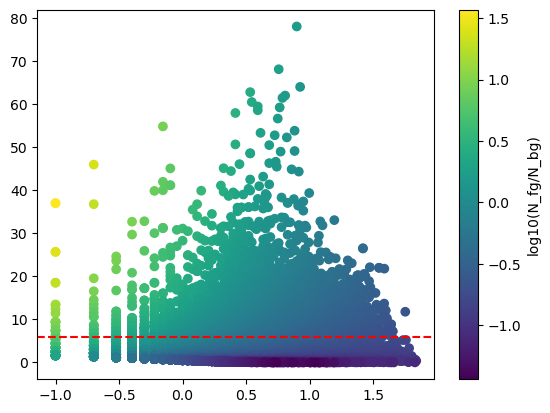

In [84]:
import matplotlib.pyplot as plt

nf = df.shape[0]
nb = ne.bg_index.idx.ntotal

p['expected_neighbors'] = (p.background_neighbors/nb)*nf

x = np.log10(p.expected_neighbors)
y = -np.log10(p.pval)
r = np.log10(p.foreground_neighbors/p.background_neighbors)

fig, ax = plt.subplots()
sc = ax.scatter(
    x=x, y=y,
    c=r, cmap='viridis'
    )

ax.axhline(6, ls='--', color='red')

fig.colorbar(sc, label='log10(N_fg/N_bg)')


In [4]:
df = parse_yfv_repertoires('./data/yfv/P2_15_F1_.txt.gz')

hasher = TCRDistEncoder(aa_dim=8, full_tcr=True)
ne = NeighborEnrichment(repertoire=df, hasher=hasher, radius=12.5)

# ne.compute_neighbors()
# p = ne.compute_pvalues()

/home/sebastiaan/PhD/Repositories/immune_response_detection/raptcr/constants/parsing.py:18: DtypeWarning: Columns (8,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file, compression='gzip', sep='\t')


In [14]:
ne.compute_neighbors()

In [16]:
ne.foreground_neighbors_to_json('P2_15_F1_neighbors.json')

In [10]:
background = pd.read_csv('./raptcr/datasets/big_background.tsv', sep='\t')

In [13]:
from raptcr.constants.sampling import get_vfam, get_jfam

background['vfam'] = get_vfam(background)

In [16]:
background.vfam.value_counts().sort_index()

TRBV10     516713
TRBV11     418969
TRBV12     419565
TRBV13     337565
TRBV14     221704
TRBV15     112763
TRBV16       3584
TRBV18     153730
TRBV19     342431
TRBV2      198337
TRBV20     711292
TRBV24     423858
TRBV25     131549
TRBV27     485561
TRBV28     291765
TRBV29     220764
TRBV3      228992
TRBV30     218330
TRBV4      378542
TRBV5     1045249
TRBV6     1452087
TRBV7     1296570
TRBV9      390080
Name: vfam, dtype: int64